<a href="https://colab.research.google.com/github/naufalnashif/test-case/blob/main/telkomsel/technical_skill_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EXPLORE Telecommunication CDRs Data of Trentino & Milano Italy From Harvard Dataverse

cc : [Naufal Nashif](https://www.linkedin.com/in/naufalnashif/)
| files : [Github](https://github.com/naufalnashif/test-case/tree/c7834a26f2cb0bf193fa1a37154b644f4ac432c4/telkomsel)

# Import Dependencies

In [ ]:
import requests
from google.colab import userdata
import pandas as pd
from IPython.display import display
import os
import glob

# Init

In [ ]:
dataset_trentino_url = "https://dataverse.harvard.edu/api/datasets/:persistentId?persistentId=doi:10.7910/DVN/QLCABU"
dataset_milano_url = "https://dataverse.harvard.edu/api/datasets/:persistentId?persistentId=doi:10.7910/DVN/EGZHFV"
grid_trentino_url = "https://dataverse.harvard.edu/api/datasets/:persistentId?persistentId=doi:10.7910/DVN/FZRVSX"
grid_milano_url = "https://dataverse.harvard.edu/api/datasets/:persistentId?persistentId=doi:10.7910/DVN/QJWLFU"
api_token = userdata.get("HARVARD_API_TOKEN")
folder_trentino = "raw_data_trentino"
folder_milano = "raw_data_milano"

In [ ]:
class Harvard_Dataset_Download:
    def __init__(self, dataset_url, api_token):
        self.dataset_url = dataset_url
        self.api_token = api_token

    def get_available_files(self):

        headers = {
            'X-Dataverse-key': self.api_token
        }
        response = requests.get(self.dataset_url, headers=headers)

        if response.status_code == 200:

            data = response.json()
            files = data['data']['latestVersion']['files']

            file_info = []

            for file in files:
                file_label = file['label']
                datafile_id = file['dataFile']['id']
                file_info.append({
                    'nama_file': file_label,
                    'datafile_id': datafile_id
                })

            return pd.DataFrame(file_info)
        else:
            print(f"Terjadi kesalahan saat mengambil metadata dataset: {response.status_code}, {response.text}")
            return None

    def download_files(self, folder_name, num_files=30):

        df_files = self.get_available_files()

        if df_files is not None:

            df_files_to_download = df_files.head(num_files)

            if not os.path.exists(folder_name):
                os.makedirs(folder_name)

            headers = {
                'X-Dataverse-key': self.api_token
            }

            for index, row in df_files_to_download.iterrows():
                file_name = row['nama_file']
                datafile_id = row['datafile_id']

                print(f"Menemukan file: {file_name} dengan datafile_id: {datafile_id}")


                file_url = f"https://dataverse.harvard.edu/api/access/datafile/{datafile_id}"


                file_response = requests.get(file_url, headers=headers)
                if file_response.status_code == 200:

                    file_path = os.path.join(folder_name, file_name)
                    with open(file_path, 'wb') as f:
                        f.write(file_response.content)
                    print(f"File {file_name} berhasil diunduh ke folder {folder_name}.")
                else:
                    print(f"Terjadi kesalahan saat mengunduh file {file_name}: {file_response.status_code}")
        else:
            print("Tidak ada file untuk diunduh.")



In [ ]:
class DataWrangling:
    def __init__(self, folder_name, col_list):
        self.folder_name = folder_name
        self.col_list = col_list

    def trentino_wrangling (self):
        #Initialize an empty dataframe to append daily and hourly resampled data
        dailyGridActivityTrentino = pd.DataFrame()
        hourlyGridActivityTrentino = pd.DataFrame()

        #Create a list of 30 data file names placed under directory  "./{folder_name}}/" with extension .txt
        filenames = glob.glob(f"./{self.folder_name}/*.txt")

        #Set the column names for the data read
        col_list = self.col_list

        #Read each tab separated file into Pandas DataFrame
        for file in filenames:
            read_data = pd.read_csv(file, sep='\t',header=None, names=col_list, parse_dates=True)

            #Convert timeInterval column which has Epoch timestamps to UTC and then convert to Milan's local timezone and save it to column startTime
            #tz_localize(None) returns local time format instead of "UTC+1:00" format
            read_data['startTime'] = pd.to_datetime(read_data.timeInterval, unit='ms', utc=True).dt.tz_convert('CET').dt.tz_localize(None)

            #Drop timeInterval & countryCode columns
            read_data.drop(columns=['timeInterval','countryCode'], inplace=True)

            #Groupby gridID and startTime, startTime which is 10 min apart is resampled to daily aggregation
            read_data_daily = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='D')]).sum()
            dailyGridActivityTrentino = pd.concat([dailyGridActivityTrentino,read_data_daily]).groupby(['gridID', 'startTime']).sum()

            #Groupby gridID and startTime, startTime which is 10 min apart is resampled to hourly aggregation
            read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='h')]).sum()
            hourlyGridActivityTrentino = pd.concat([hourlyGridActivityTrentino,read_data_hourly]).groupby(['gridID', 'startTime']).sum()

        #Get Grid wise total volume of the activities over the months
        totalGridActivityTrentino = dailyGridActivityTrentino.groupby('gridID').sum()
        return dailyGridActivityTrentino, hourlyGridActivityTrentino, totalGridActivityTrentino

    def milano_wrangling (self):
        #Initialize an empty dataframe to append daily and hourly resampled data
        dailyGridActivityMilano = pd.DataFrame()
        hourlyGridActivityMilano = pd.DataFrame()

        #Create a list of 30 data file names placed under directory  "./raw_data_Milano/" with extension .txt
        filenames = glob.glob(f"./{self.folder_name}/*.txt")

        #Set the column names for the data read
        col_list = self.col_list

        #Read each tab separated file into Pandas DataFrame
        for file in filenames:
            read_data = pd.read_csv(file, sep='\t',header=None, names=col_list, parse_dates=True)

            #Convert timeInterval column which has Epoch timestamps to UTC and then convert to Milan's local timezone and save it to column startTime
            #tz_localize(None) returns local time format instead of "UTC+1:00" format
            read_data['startTime'] = pd.to_datetime(read_data.timeInterval, unit='ms', utc=True).dt.tz_convert('CET').dt.tz_localize(None)

            #Drop timeInterval & countryCode columns
            read_data.drop(columns=['timeInterval','countryCode'], inplace=True)

            #Groupby gridID and startTime, startTime which is 10 min apart is resampled to daily aggregation
            read_data_daily = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='D')]).sum()
            dailyGridActivityMilano = pd.concat([dailyGridActivityMilano,read_data_daily]).groupby(['gridID', 'startTime']).sum()

            #Groupby gridID and startTime, startTime which is 10 min apart is resampled to hourly aggregation
            read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='h')]).sum()
            hourlyGridActivityMilano = pd.concat([hourlyGridActivityMilano,read_data_hourly]).groupby(['gridID', 'startTime']).sum()

        #Get Grid wise total volume of the activities over the months
        totalGridActivityMilano = dailyGridActivityMilano.groupby('gridID').sum()

        return dailyGridActivityMilano, hourlyGridActivityMilano, totalGridActivityMilano

# Get The Data

In [ ]:
# Trentino
dataset_downloader = Harvard_Dataset_Download(dataset_trentino_url, api_token)
dataset_downloader.download_files(folder_trentino, num_files=30)

print("------------------------------------------------")
# Milano
dataset_downloader = Harvard_Dataset_Download(dataset_milano_url, api_token)
dataset_downloader.download_files(folder_milano, num_files=30)

Menemukan file: sms-call-internet-tn-2013-11-01.txt dengan datafile_id: 2674712
File sms-call-internet-tn-2013-11-01.txt berhasil diunduh ke folder raw_data_trentino.
Menemukan file: sms-call-internet-tn-2013-11-02.txt dengan datafile_id: 2674718
File sms-call-internet-tn-2013-11-02.txt berhasil diunduh ke folder raw_data_trentino.
Menemukan file: sms-call-internet-tn-2013-11-03.txt dengan datafile_id: 2674726
File sms-call-internet-tn-2013-11-03.txt berhasil diunduh ke folder raw_data_trentino.
Menemukan file: sms-call-internet-tn-2013-11-04.txt dengan datafile_id: 2674730
File sms-call-internet-tn-2013-11-04.txt berhasil diunduh ke folder raw_data_trentino.
Menemukan file: sms-call-internet-tn-2013-11-05.txt dengan datafile_id: 2674734
File sms-call-internet-tn-2013-11-05.txt berhasil diunduh ke folder raw_data_trentino.
Menemukan file: sms-call-internet-tn-2013-11-06.txt dengan datafile_id: 2674738
File sms-call-internet-tn-2013-11-06.txt berhasil diunduh ke folder raw_data_trentino

In [ ]:
# Trentino
grid_trentino_downloader = Harvard_Dataset_Download(grid_trentino_url, api_token)
grid_trentino_downloader.get_available_files()

,nama_file,datafile_id
0,trentino-grid.geojson,2674653


In [ ]:
# Milano
grid_milano_downloader = Harvard_Dataset_Download(grid_milano_url, api_token)
grid_milano_downloader.get_available_files()

,nama_file,datafile_id
0,milano-grid.geojson,2670806


In [ ]:
# Trentino
grid_trentino_downloader.download_files(folder_trentino ,num_files=1)

Menemukan file: trentino-grid.geojson dengan datafile_id: 2674653
File trentino-grid.geojson berhasil diunduh ke folder raw_data_trentino.


In [ ]:
# Milano
grid_milano_downloader.download_files(folder_milano, num_files=1)

Menemukan file: milano-grid.geojson dengan datafile_id: 2670806
File milano-grid.geojson berhasil diunduh ke folder raw_data_milano.


# Data Wrangling

In [ ]:
col_list = ['gridID', 'timeInterval', 'countryCode', 'smsIn', 'smsOut', 'callIn', 'callOut', 'internet']

In [ ]:
#Sample of format of each line as read from the input file Trentino
read_data = pd.read_csv('raw_data_trentino/sms-call-internet-tn-2013-11-01.txt', sep='\t',header=None, names=col_list, parse_dates=True)
read_data.head(10)

,gridID,timeInterval,countryCode,smsIn,smsOut,callIn,callOut,internet
0,10000,1383260400000,0,0.109442,NaN,NaN,0.021888,NaN
1,10000,1383260400000,39,1.000626,1.264627,0.087554,0.219587,10.168455
2,10000,1383260400000,49,NaN,NaN,NaN,NaN,0.021888
3,10000,1383261000000,0,0.193200,NaN,NaN,NaN,NaN
4,10000,1383261000000,39,0.648294,1.058651,0.175108,0.153219,11.867058
5,10000,1383261600000,0,0.104894,NaN,NaN,NaN,NaN
6,10000,1383261600000,39,1.171984,1.424300,0.184609,0.254348,12.627643
7,10000,1383262200000,0,0.066017,NaN,NaN,NaN,NaN
8,10000,1383262200000,39,0.700300,0.768250,0.109442,0.153570,13.332939
9,10000,1383262200000,49,NaN,NaN,NaN,0.021888,NaN


In [ ]:
#Sample of format of each line as read from the input file Milano
read_data = pd.read_csv('raw_data_milano/sms-call-internet-mi-2013-11-01.txt', sep='\t',header=None, names=col_list, parse_dates=True)
read_data.head(10)

,gridID,timeInterval,countryCode,smsIn,smsOut,callIn,callOut,internet
0,1,1383260400000,0,0.081363,NaN,NaN,NaN,NaN
1,1,1383260400000,39,0.141864,0.156787,0.160938,0.052275,11.028366
2,1,1383261000000,0,0.136588,NaN,NaN,0.027300,NaN
3,1,1383261000000,33,NaN,NaN,NaN,NaN,0.026137
4,1,1383261000000,39,0.278452,0.119926,0.188777,0.133637,11.100963
5,1,1383261600000,0,0.053438,NaN,NaN,NaN,NaN
6,1,1383261600000,39,0.330641,0.170952,0.134176,0.054601,10.892771
7,1,1383262200000,0,0.026137,NaN,NaN,NaN,NaN
8,1,1383262200000,39,0.681434,0.220815,0.027300,0.053438,8.622425
9,1,1383262800000,0,0.027300,NaN,NaN,NaN,NaN


In [ ]:
# Trentino
trentino_data_wrangler = DataWrangling(folder_trentino, col_list)
dailyGridActivityTrentino, hourlyGridActivityTrentino, totalGridActivityTrentino = trentino_data_wrangler.trentino_wrangling()

# Milano
milano_data_wrangler = DataWrangling(folder_milano, col_list)
dailyGridActivityMilano, hourlyGridActivityMilano, totalGridActivityMilano = milano_data_wrangler.milano_wrangling()

##### Hourly Dataset Info Check

In [ ]:
print("Trentino:")
display(hourlyGridActivityTrentino.head(5))
print("Milano:")
display(hourlyGridActivityMilano.head(5))

Trentino:


smsIn    smsOut    callIn   callOut   internet
gridID startTime                                                             
38     2013-11-01 00:00:00  3.230043  2.702733  0.547075  0.103967  59.390485
       2013-11-01 01:00:00  1.097136  2.739491  0.033146  0.019763  53.550552
       2013-11-01 02:00:00  1.001066  2.334906  0.414200  0.238357  56.370072
       2013-11-01 03:00:00  0.330291  1.296179  0.108073  0.000000  54.443087
       2013-11-01 04:00:00  0.595967  0.820119  0.104597  0.033146  50.946916

Milano:


smsIn    smsOut    callIn   callOut   internet
gridID startTime                                                             
1      2013-11-01 00:00:00  2.084285  1.104749  0.591930  0.429290  57.799009
       2013-11-01 01:00:00  1.163624  0.770031  0.190564  0.194139  44.046899
       2013-11-01 02:00:00  0.415579  0.300391  0.027925  0.135964  41.207149
       2013-11-01 03:00:00  1.152067  0.895724  0.001787  0.026137  33.022070
       2013-11-01 04:00:00  0.354453  0.511192  0.005362  0.026137  31.376930

In [ ]:
print("Trentino:")
print(hourlyGridActivityTrentino.info())
print()
print("Milano:")
print(hourlyGridActivityMilano.info())

Trentino:
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 4499476 entries, (38, Timestamp('2013-11-01 00:00:00')) to (11454, Timestamp('2013-11-30 23:00:00'))
Data columns (total 5 columns):
 #   Column    Dtype  
---  ------    -----  
 0   smsIn     float64
 1   smsOut    float64
 2   callIn    float64
 3   callOut   float64
 4   internet  float64
dtypes: float64(5)
memory usage: 188.9 MB
None

Milano:
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 7199804 entries, (1, Timestamp('2013-11-01 00:00:00')) to (10000, Timestamp('2013-11-30 23:00:00'))
Data columns (total 5 columns):
 #   Column    Dtype  
---  ------    -----  
 0   smsIn     float64
 1   smsOut    float64
 2   callIn    float64
 3   callOut   float64
 4   internet  float64
dtypes: float64(5)
memory usage: 302.2 MB
None


In [ ]:
print("Trentino:")
display(hourlyGridActivityTrentino.describe())
print("Milano:")
display(hourlyGridActivityMilano.describe())

Trentino:


,smsIn,smsOut,callIn,callOut,internet
count,4.499476e+06,4.499476e+06,4.499476e+06,4.499476e+06,4.499476e+06
mean,8.837342e+00,5.650022e+00,4.755408e+00,5.213180e+00,8.143200e+01
std,3.908837e+01,2.562148e+01,1.988394e+01,2.258514e+01,2.762393e+02
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.252575e-01,2.187187e-01,9.988937e-02,9.086684e-02,1.210803e+01
50%,2.296583e+00,1.487174e+00,9.116942e-01,9.887336e-01,3.440370e+01
75%,8.290948e+00,5.131531e+00,4.311474e+00,4.652417e+00,7.958680e+01
max,4.497655e+03,3.039643e+03,1.549437e+03,1.838658e+03,2.545940e+04


Milano:


,smsIn,smsOut,callIn,callOut,internet
count,7.199804e+06,7.199804e+06,7.199804e+06,7.199804e+06,7.199804e+06
mean,2.869220e+01,1.562888e+01,1.909224e+01,2.168962e+01,4.142735e+02
std,6.853183e+01,3.731506e+01,4.629592e+01,5.125564e+01,7.991173e+02
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.928107e+00,1.330551e+00,7.719927e-01,1.005179e+00,7.125281e+01
50%,8.402747e+00,4.880043e+00,4.732218e+00,5.667532e+00,1.776701e+02
75%,2.732240e+01,1.443568e+01,1.828793e+01,2.091087e+01,4.123122e+02
max,4.010647e+03,3.595381e+03,1.533557e+03,1.654122e+03,3.535091e+04


##### Daily Check Info Check

In [ ]:
print("Trentino: ")
display(dailyGridActivityTrentino.head(5))

print("Milano: ")
display(dailyGridActivityMilano.head(5))

Trentino: 


smsIn      smsOut      callIn     callOut     internet
gridID startTime                                                              
38     2013-11-01  187.845291  107.213688   64.742203   68.514244  2723.530296
       2013-11-02  163.131175   87.560931   69.793661   68.067230  2524.820037
       2013-11-03  182.498534   97.581719   61.226442   67.466933  3333.192953
       2013-11-04  198.276596   97.977208   91.662412  108.360390  2631.842338
       2013-11-05  187.329690   92.121137  100.068799  102.324108  2353.895536

Milano: 


smsIn     smsOut     callIn    callOut     internet
gridID startTime                                                           
1      2013-11-01   78.709755  45.886570  41.108567  48.245378  1507.048349
       2013-11-02   86.415810  43.875946  47.891016  53.590637  1515.641856
       2013-11-03   77.728292  45.446780  36.145436  40.906425  1533.148425
       2013-11-04  104.793806  54.821018  67.898464  70.399418  1404.813593
       2013-11-05   97.425105  46.607029  68.735213  70.766221  1518.090111

In [ ]:
# Trentino
display(dailyGridActivityTrentino.info())

# Milano
display(dailyGridActivityMilano.info())

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 187737 entries, (38, Timestamp('2013-11-01 00:00:00')) to (11454, Timestamp('2013-11-30 00:00:00'))
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   smsIn     187737 non-null  float64
 1   smsOut    187737 non-null  float64
 2   callIn    187737 non-null  float64
 3   callOut   187737 non-null  float64
 4   internet  187737 non-null  float64
dtypes: float64(5)
memory usage: 7.7 MB


None

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 299997 entries, (1, Timestamp('2013-11-01 00:00:00')) to (10000, Timestamp('2013-11-30 00:00:00'))
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   smsIn     299997 non-null  float64
 1   smsOut    299997 non-null  float64
 2   callIn    299997 non-null  float64
 3   callOut   299997 non-null  float64
 4   internet  299997 non-null  float64
dtypes: float64(5)
memory usage: 12.4 MB


None

In [ ]:
print("Trentino: ")
display(dailyGridActivityTrentino.describe())

print("Milano: ")
display(dailyGridActivityMilano.describe())

Trentino: 


,smsIn,smsOut,callIn,callOut,internet
count,187737.000000,187737.000000,187737.000000,187737.000000,187737.000000
mean,211.803793,135.413587,113.972441,124.943816,1951.673628
std,749.100124,503.951471,356.007767,407.321361,6069.229302
min,0.000000,0.000000,0.000000,0.000000,0.000112
25%,29.563027,16.706974,16.952804,17.785982,313.622089
50%,91.465628,55.704482,50.315112,53.448087,877.884555
75%,208.901775,130.557412,114.266296,123.902552,1960.278985
max,46628.143611,33213.974477,15806.274212,19341.925546,311037.000017


Milano: 


,smsIn,smsOut,callIn,callOut,internet
count,299997.000000,299997.000000,299997.000000,299997.000000,299997.000000
mean,688.600835,375.086541,458.205922,520.541897,9942.393323
std,1224.850000,695.150464,790.190655,883.273069,16942.992657
min,0.000000,0.000000,0.000000,0.000000,0.300023
25%,121.759458,64.794630,82.909399,95.821674,1922.750509
50%,311.743626,162.328871,214.315652,242.817113,4681.060707
75%,689.448732,370.853833,480.100634,547.568944,10074.000561
max,23145.268911,24704.834073,14434.684752,17533.632569,298661.604333


##### Total volume activity on November 2023 in Trentino & Milano

In [ ]:
print("Trentino: ")
display(totalGridActivityTrentino)

print("Milano: ")
display(totalGridActivityMilano)

Trentino: 


,smsIn,smsOut,callIn,callOut,internet
gridID,,,,,
38,5562.715828,2762.741346,2615.260498,2729.578517,76121.802876
39,5723.687254,2358.041764,2477.574200,2720.327673,70203.706430
40,6965.917989,3129.215774,2486.484682,2820.994526,66599.302339
154,10092.857086,4131.305623,4211.957685,4570.879027,94265.841008
155,8820.046687,3480.028009,3546.283434,3923.175898,100318.981754
...,...,...,...,...,...
11336,1045.137419,1016.827662,610.585779,584.995201,7421.061046
11337,1444.260073,1009.801404,1126.066995,1031.941071,16012.323106
11452,29497.909727,21920.444026,11583.441478,11254.426617,147017.332970


Milano: 


,smsIn,smsOut,callIn,callOut,internet
gridID,,,,,
1,2895.937859,1576.921301,1822.495824,1907.933917,44414.415098
2,2938.356279,1598.669534,1849.228590,1937.770608,44597.613500
3,2983.509008,1621.819668,1877.684561,1969.530584,44792.620951
4,2773.072142,1513.927153,1745.063887,1821.511405,43883.777627
5,2585.440405,1414.983810,1631.204104,1706.438555,40035.363125
...,...,...,...,...,...
9996,9757.341256,4994.223166,6537.666117,7495.598659,166051.710359
9997,10589.399386,5297.811916,6983.863811,7990.937296,180549.793304
9998,10410.884058,5229.362392,6884.415523,7881.735904,177851.383264


#### Add columns : weekdayFlag

In [ ]:
#Create additional columns hours:hour of the day, weekdayFlag: weekend or weekday information
dailyGridActivityTrentino['weekdayFlag'] = dailyGridActivityTrentino.index.get_level_values(1)
dailyGridActivityTrentino['weekdayFlag'] = dailyGridActivityTrentino['weekdayFlag'].dt.weekday

hourlyGridActivityTrentino['weekdayFlag'] = hourlyGridActivityTrentino.index.get_level_values(1)
hourlyGridActivityTrentino['weekdayFlag'] = hourlyGridActivityTrentino['weekdayFlag'].dt.weekday

hourlyGridActivityTrentino['hours'] = hourlyGridActivityTrentino.index.get_level_values(1)
hourlyGridActivityTrentino['hours'] = hourlyGridActivityTrentino['hours'].dt.hour

dailyGridActivityTrentino['sms'] = dailyGridActivityTrentino['smsIn'] + dailyGridActivityTrentino['smsOut']
dailyGridActivityTrentino['call'] = dailyGridActivityTrentino['callIn'] + dailyGridActivityTrentino['callOut']

hourlyGridActivityTrentino['sms'] = hourlyGridActivityTrentino['smsIn'] + hourlyGridActivityTrentino['smsOut']
hourlyGridActivityTrentino['call'] = hourlyGridActivityTrentino['callIn'] + hourlyGridActivityTrentino['callOut']

totalGridActivityTrentino['sms'] = totalGridActivityTrentino['smsIn']+totalGridActivityTrentino['smsOut']
totalGridActivityTrentino['call'] = totalGridActivityTrentino['callIn']+totalGridActivityTrentino['callOut']

In [ ]:
#Create additional columns hours:hour of the day, weekdayFlag: weekend or weekday information
dailyGridActivityMilano['weekdayFlag'] = dailyGridActivityMilano.index.get_level_values(1)
dailyGridActivityMilano['weekdayFlag'] = dailyGridActivityMilano['weekdayFlag'].dt.weekday

hourlyGridActivityMilano['weekdayFlag'] = hourlyGridActivityMilano.index.get_level_values(1)
hourlyGridActivityMilano['weekdayFlag'] = hourlyGridActivityMilano['weekdayFlag'].dt.weekday

hourlyGridActivityMilano['hours'] = hourlyGridActivityMilano.index.get_level_values(1)
hourlyGridActivityMilano['hours'] = hourlyGridActivityMilano['hours'].dt.hour

dailyGridActivityMilano['sms'] = dailyGridActivityMilano['smsIn'] + dailyGridActivityMilano['smsOut']
dailyGridActivityMilano['call'] = dailyGridActivityMilano['callIn'] + dailyGridActivityMilano['callOut']

hourlyGridActivityMilano['sms'] = hourlyGridActivityMilano['smsIn'] + hourlyGridActivityMilano['smsOut']
hourlyGridActivityMilano['call'] = hourlyGridActivityMilano['callIn'] + hourlyGridActivityMilano['callOut']

totalGridActivityMilano['sms'] = totalGridActivityMilano['smsIn']+totalGridActivityMilano['smsOut']
totalGridActivityMilano['call'] = totalGridActivityMilano['callIn']+totalGridActivityMilano['callOut']

In [ ]:
display(dailyGridActivity.head(10))
display(hourlyGridActivity.head(10))

smsIn      smsOut      callIn     callOut  \
gridID startTime                                                    
38     2013-11-01  187.845291  107.213688   64.742203   68.514244   
       2013-11-02  163.131175   87.560931   69.793661   68.067230   
       2013-11-03  182.498534   97.581719   61.226442   67.466933   
       2013-11-04  198.276596   97.977208   91.662412  108.360390   
       2013-11-05  187.329690   92.121137  100.068799  102.324108   
       2013-11-06  187.419779   93.506248  105.060050  108.966792   
       2013-11-07  211.701968  104.775325  111.135254  116.548355   
       2013-11-08  222.066160  103.365100  107.001554  116.265783   
       2013-11-09  184.947567   94.919572   75.537663   71.795538   
       2013-11-10  137.206767   79.267497   50.601138   52.631717   

                      internet  weekdayFlag         sms        call  
gridID startTime                                                     
38     2013-11-01  2723.530296            4  295.058979  133.256447  
       2013-11-02  2524.820037            5  250.692107  137.860891  
       2013-11-03  3333.192953            6  280.080254  128.693375  
       2013-11-04  2631.842338            0  296.253804  200.022802  
       2013-11-05  2353.895536            1  279.450827  202.392907  
       2013-11-06  2477.500546            2  280.926027  214.026842  
       2013-11-07  2638.414242            3  316.477293  227.683608  
       2013-11-08  2736.863390            4  325.431260  223.267337  
       2013-11-09  2442.126704            5  279.867139  147.333201  
       2013-11-10  2368.900696            6  216.474264  103.232856

smsIn    smsOut    callIn   callOut  \
gridID startTime                                                      
38     2013-11-01 00:00:00   3.230043  2.702733  0.547075  0.103967   
       2013-11-01 01:00:00   1.097136  2.739491  0.033146  0.019763   
       2013-11-01 02:00:00   1.001066  2.334906  0.414200  0.238357   
       2013-11-01 03:00:00   0.330291  1.296179  0.108073  0.000000   
       2013-11-01 04:00:00   0.595967  0.820119  0.104597  0.033146   
       2013-11-01 05:00:00   0.808592  0.200928  0.093115  0.123046   
       2013-11-01 06:00:00   1.391219  2.491218  0.862393  0.332312   
       2013-11-01 07:00:00   2.289374  0.971929  0.663619  0.850765   
       2013-11-01 08:00:00   9.918490  4.923641  1.183932  2.852245   
       2013-11-01 09:00:00  11.146825  3.827831  3.539031  4.013754   

                              internet  weekdayFlag  hours        sms  \
gridID startTime                                                        
38     2013-11-01 00:00:00   59.390485            4      0   5.932776   
       2013-11-01 01:00:00   53.550552            4      1   3.836627   
       2013-11-01 02:00:00   56.370072            4      2   3.335972   
       2013-11-01 03:00:00   54.443087            4      3   1.626470   
       2013-11-01 04:00:00   50.946916            4      4   1.416086   
       2013-11-01 05:00:00   52.458089            4      5   1.009520   
       2013-11-01 06:00:00   63.130320            4      6   3.882438   
       2013-11-01 07:00:00   67.252935            4      7   3.261303   
       2013-11-01 08:00:00  103.966948            4      8  14.842131   
       2013-11-01 09:00:00  140.714442            4      9  14.974656   

                                call  
gridID startTime                      
38     2013-11-01 00:00:00  0.651042  
       2013-11-01 01:00:00  0.052909  
       2013-11-01 02:00:00  0.652558  
       2013-11-01 03:00:00  0.108073  
       2013-11-01 04:00:00  0.137743  
       2013-11-01 05:00:00  0.216162  
       2013-11-01 06:00:00  1.194705  
       2013-11-01 07:00:00  1.514385  
       2013-11-01 08:00:00  4.036177  
       2013-11-01 09:00:00  7.552785

# EDA & Analysis

In [ ]:
pip install folium

In [ ]:
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

## Trentino

### Visualize Geojson Trentino

In [ ]:
trentino = gpd.read_file('./raw_data_trentino/trentino-grid.geojson')
m = folium.Map(location=[46.0703, 11.1216], zoom_start=9)

folium.GeoJson(trentino).add_to(m)

m


### Top 10

##### Top 10 Sms, Call, and Internet Activities in Trentino

In [ ]:
#Sort grids by total volumes of SMS, Call & Internet activities
smsGridActivity = totalGridActivityTrentino[['sms']].sort_values(by = 'sms',ascending=False)
callGridActivity = totalGridActivityTrentino[['call']].sort_values(by = 'call',ascending=False)
internetGridActivity = totalGridActivityTrentino[['internet']].sort_values(by = 'internet',ascending=False)
#Fetch the top 10 grids from the sorted grids and display them
top10 = pd.DataFrame()
top10['sms'] = smsGridActivity[:10].index.values
top10['call'] = callGridActivity[:10].index.values
top10['internet'] = internetGridActivity[:10].index.values
top10

,sms,call,internet
0,5200,5200,5200
1,5084,5201,5201
2,5201,5084,5084
3,5083,5434,5083
4,4967,5083,5317
5,5434,5317,5434
6,5317,4967,5318
7,2855,5551,2854
8,2854,2855,4967
9,5551,5318,2855


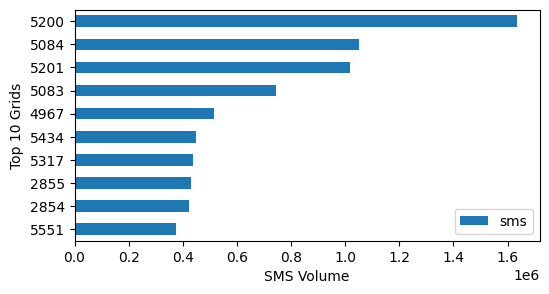

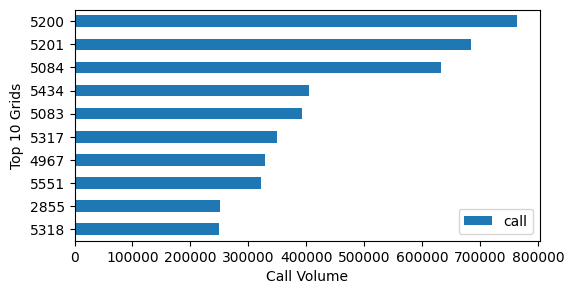

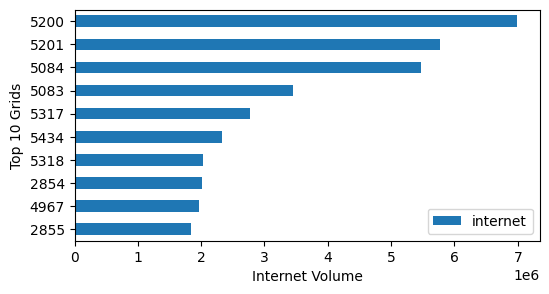

In [ ]:
#Plot top 10 grids and its volume for SMS activity
ax = smsGridActivity[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("SMS Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Call activity
ax = callGridActivity[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("Call Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Internet activity
ax = internetGridActivity[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("Internet Volume")
ax.set_ylabel("Top 10 Grids")
plt.show()

##### Mapping top 10 Grid in Trentino

In [ ]:
# Hover to get the grid ID

topgrids = pd.unique(top10.values.ravel())
topGridgeojson = trentino.loc[trentino['cellId'].isin(topgrids)]

m = folium.Map(location=[46.0703, 11.1216], zoom_start=10)

for _, row in topGridgeojson.iterrows():
    grid_id = row['cellId']

    folium.GeoJson(
        row['geometry'],
        tooltip=str(grid_id),  # Display the grid ID on hover
        popup=f"Grid ID: {grid_id}"  # Display the grid ID on click
    ).add_to(m)

m

#### SMS, Call, Internet Activity Comparison in Top Grids

In [ ]:
#get the daily volumes for the top 10 grids
daily5200 = dailyGridActivityTrentino.loc[5200][['sms','call','internet']]
daily5084 = dailyGridActivityTrentino.loc[5084][['sms','call','internet']]
daily5201 = dailyGridActivityTrentino.loc[5201][['sms','call','internet']]
daily5083 = dailyGridActivityTrentino.loc[5083][['sms','call','internet']]
daily4967 = dailyGridActivityTrentino.loc[4967][['sms','call','internet']]
daily5434 = dailyGridActivityTrentino.loc[5434][['sms','call','internet']]
daily5317 = dailyGridActivityTrentino.loc[5317][['sms','call','internet']]
daily2855 = dailyGridActivityTrentino.loc[2855][['sms','call','internet']]
daily2854 = dailyGridActivityTrentino.loc[2854][['sms','call','internet']]
daily5551 = dailyGridActivityTrentino.loc[5551][['sms','call','internet']]
daily5318 = dailyGridActivityTrentino.loc[5318][['sms','call','internet']]

#### Plot daily SMS activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

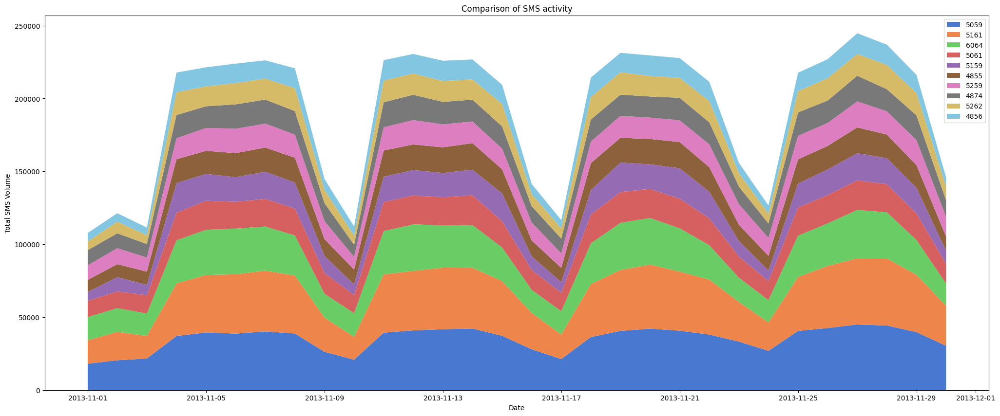

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily5200.index, daily5084.sms, daily5201.sms,daily5083.sms, daily4967.sms,
                   daily5434.sms, daily5317.sms, daily2855.sms, daily2854.sms, daily5551.sms,
                   daily5318.sms, labels = top10['sms'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total SMS Volume')
plt.title('Comparison of SMS activity')
plt.show()

#### Plot daily Call activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

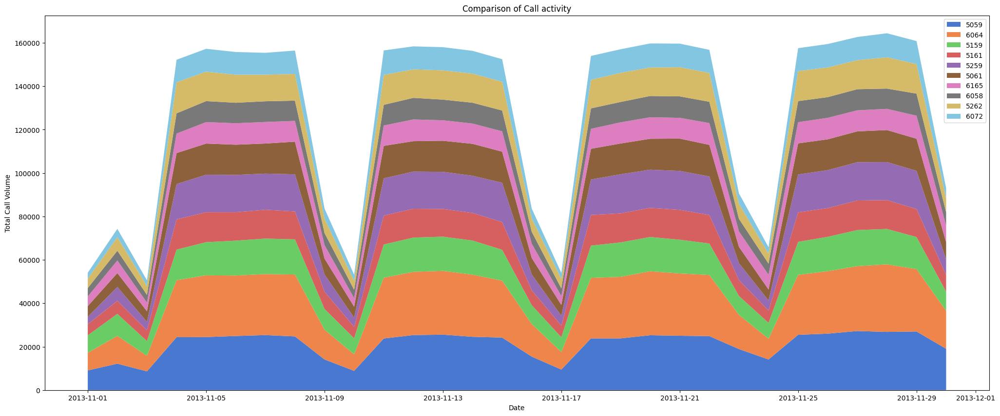

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily5200.index, daily5084.call, daily5201.call,daily5083.call, daily4967.call,
                   daily5434.call, daily5317.call, daily2855.call, daily2854.call, daily5551.call,
                   daily5318.call, labels = top10['call'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total Call Volume')
plt.title('Comparison of Call activity')
plt.show()


#### Plot daily Internet activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

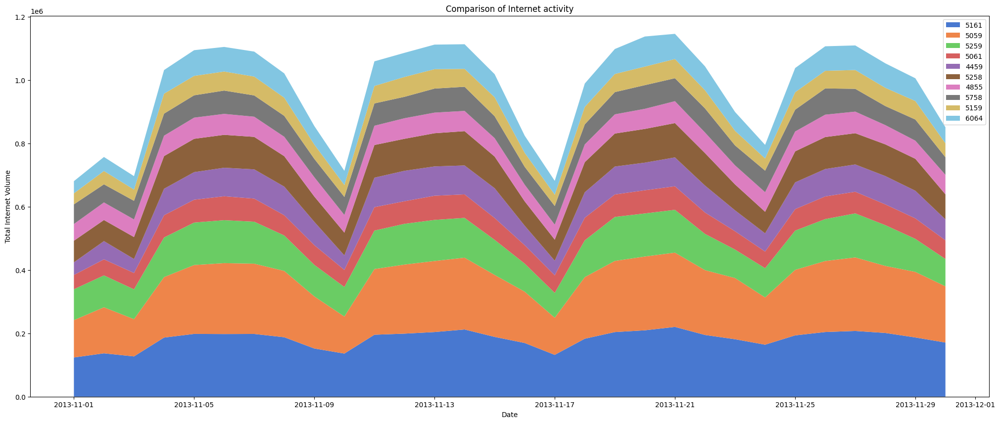

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily5200.index, daily5084.internet, daily5201.internet,daily5083.internet, daily4967.internet,
                   daily5434.internet, daily5317.internet, daily2855.internet, daily2854.internet, daily5551.internet,
                   daily5318.internet, labels = top10['internet'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total Internet Volume')
plt.title('Comparison of Internet activity')
plt.show()


#### Comparison Daily Activity Pattern

##### In Trento (Grid 5200)

<Figure size 2500x1000 with 0 Axes>

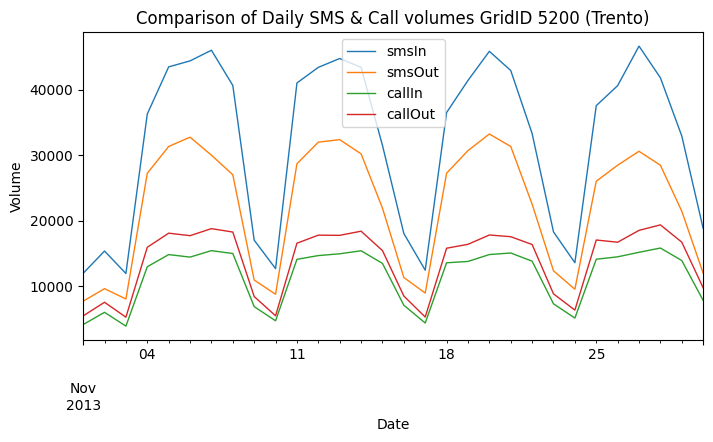

In [ ]:
#Next line is to fix an error that occurs after installing FBProphet module
pd.plotting.register_matplotlib_converters()

#Plot Daily SMS-In, SMS-Out, Call-In, Call-Out activity pattern for GridID 5200
daily5200 = dailyGridActivityTrentino.loc[5200]
plt.figure(figsize=(25,10))
ax = daily5200.loc[:,['smsIn', 'smsOut', 'callIn', 'callOut']].plot(figsize=(8, 4), fontsize=10, linewidth=1)
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Comparison of Daily SMS & Call volumes GridID 5200 (Trento)')
# plt.axvspan('2013-11-26', '2013-11-26', color='red')
# plt.axvspan('2013-11-29', '2013-11-29', color='red')
plt.show()

##### In Rovento (Grid 2854)

<Figure size 2500x1000 with 0 Axes>

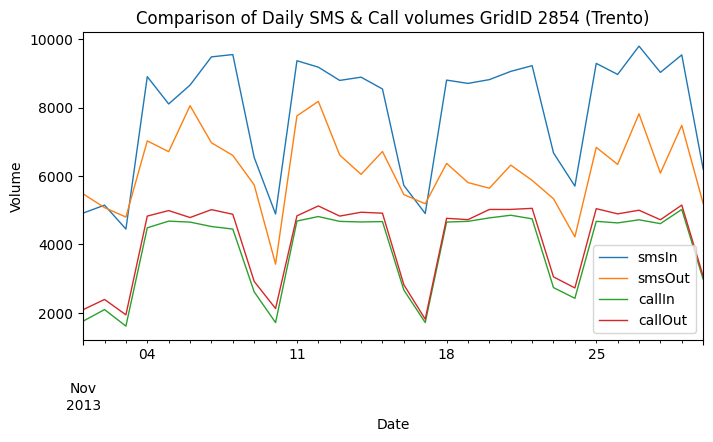

In [ ]:
#Next line is to fix an error that occurs after installing FBProphet module
pd.plotting.register_matplotlib_converters()

#Plot Daily SMS-In, SMS-Out, Call-In, Call-Out activity pattern for GridID 2854
daily2854 = dailyGridActivityTrentino.loc[2854]
plt.figure(figsize=(25,10))
ax = daily2854.loc[:,['smsIn', 'smsOut', 'callIn', 'callOut']].plot(figsize=(8, 4), fontsize=10, linewidth=1)
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Comparison of Daily SMS & Call volumes GridID 2854 (Trento)')
# plt.axvspan('2013-11-26', '2013-11-26', color='red')
# plt.axvspan('2013-11-29', '2013-11-29', color='red')
plt.show()

#### Comparison of Hourly Activity Pattern in Grid ID 5200 (Trento) & 2854 (Rovento)

In [ ]:
#Set this to None to avoid Warning messages from Pandas
pd.options.mode.chained_assignment = None

#Get hourly data for the four grids
hourly5200 = hourlyGridActivityTrentino.loc[5200]
hourly2854 = hourlyGridActivityTrentino.loc[2854]


#Add column to identify Day of the week for each observation
hourly5200['dayOfWeek'] = hourly5200.index.day_name()
hourly2854['dayOfWeek'] = hourly2854.index.day_name()


#Use pivot_table() reshape the dataframe with Mean values of the acitivities for Day of the week as columns and hours in a day as index
hourly5200_sms = hourly5200.pivot_table(index=hourly5200.index.hour,
                                                            columns='dayOfWeek', values='sms', aggfunc='mean')
hourly5200_call = hourly5200.pivot_table(index=hourly5200.index.hour,
                                                            columns='dayOfWeek', values='call', aggfunc='mean')
hourly5200_internet = hourly5200.pivot_table(index=hourly5200.index.hour,
                                                            columns='dayOfWeek', values='internet', aggfunc='mean')
hourly2854_sms = hourly2854.pivot_table(index=hourly2854.index.hour,
                                                            columns='dayOfWeek', values='sms', aggfunc='mean')
hourly2854_call = hourly2854.pivot_table(index=hourly2854.index.hour,
                                                            columns='dayOfWeek', values='call', aggfunc='mean')
hourly2854_internet = hourly2854.pivot_table(index=hourly2854.index.hour,
                                                            columns='dayOfWeek', values='internet', aggfunc='mean')


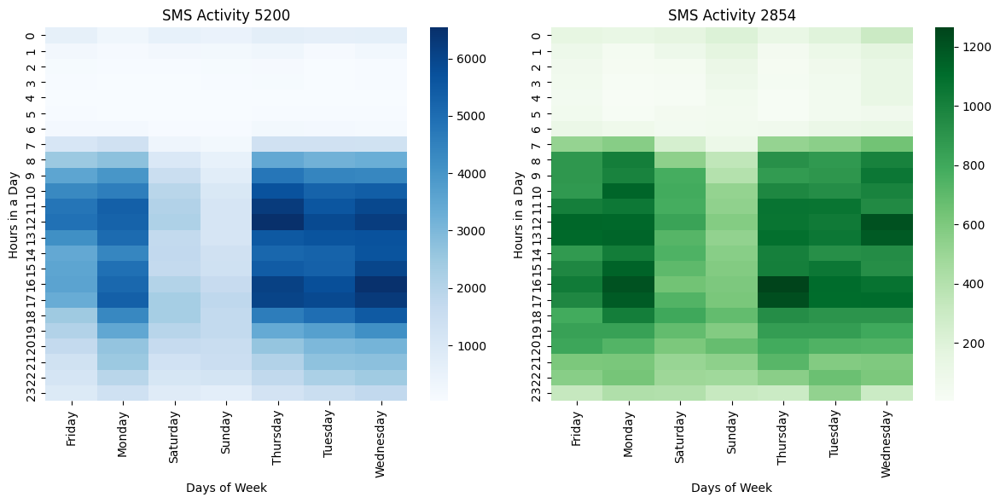

In [ ]:
# From the reshaped dataframe, plot heatmap for SMS activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5200
sns.heatmap(hourly5200_sms, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("SMS Activity 5200")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 2854
sns.heatmap(hourly2854_sms, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("SMS Activity 2854")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()


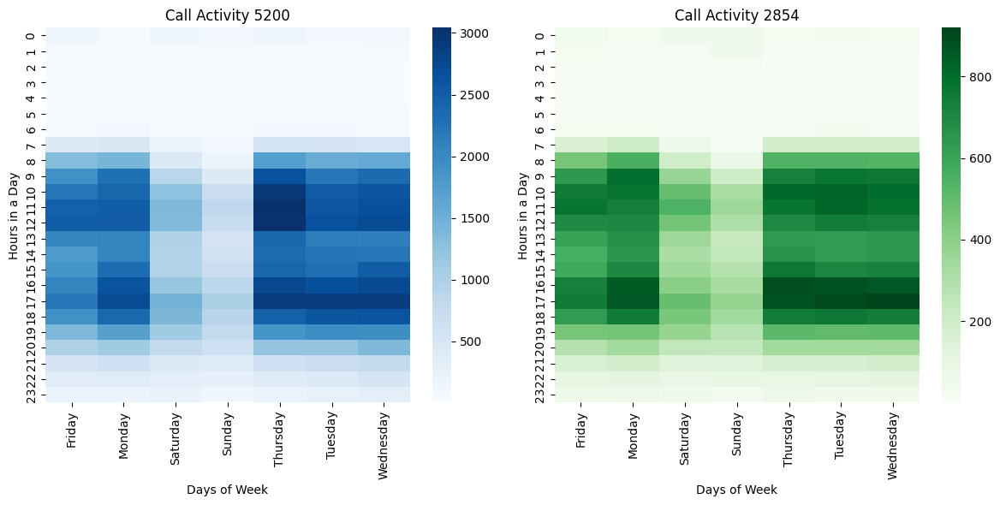

In [ ]:
# From the reshaped dataframe, plot heatmap for call activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5200
sns.heatmap(hourly5200_call, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("Call Activity 5200")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 2854
sns.heatmap(hourly2854_call, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("Call Activity 2854")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()

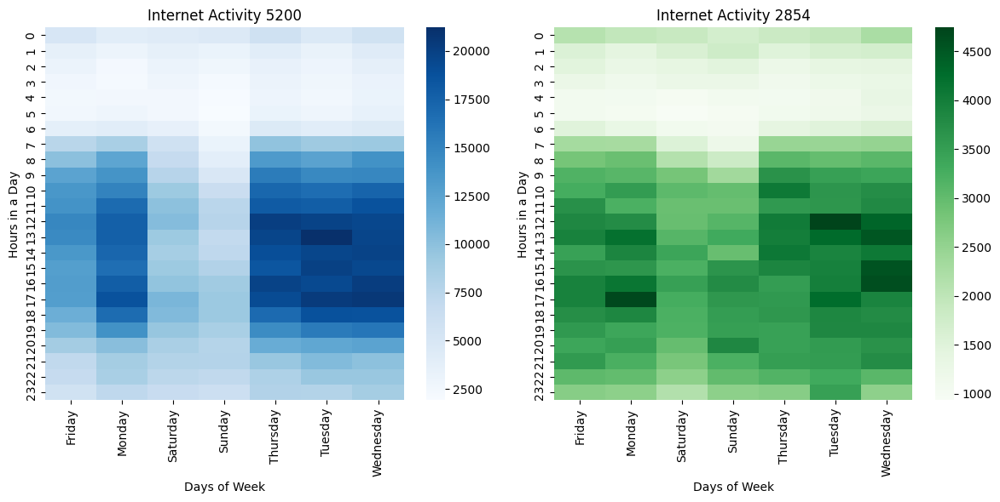

In [ ]:
# From the reshaped dataframe, plot heatmap for internet activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5200
sns.heatmap(hourly5200_internet, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("Internet Activity 5200")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 2854
sns.heatmap(hourly2854_internet, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("Internet Activity 2854")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()


### Correlation between Call, SMS, and Internet Usage (using daily data)

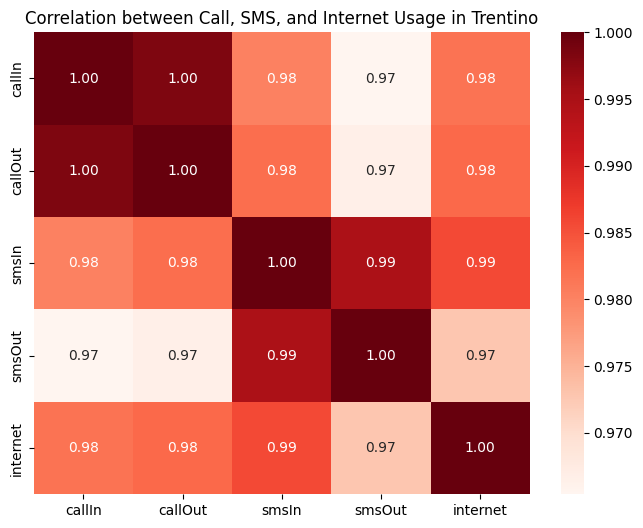

In [ ]:

usage_data = dailyGridActivityTrentino.groupby(level=0)[['callIn', 'callOut', 'smsIn', 'smsOut', 'internet']].sum()
correlation_matrix = usage_data.corr()

# Plot correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt='.2f', cbar=True)
plt.title('Correlation between Call, SMS, and Internet Usage in Trentino')
plt.show()

### Insight


**Business Insight Analysis for Telecommunication in Trentino, Italy**

**Overview of Trentino**
Trentino, located in the northern region of Italy, is renowned for its natural landscapes, tourism, and its role as a growing hub for education and innovation. Home to cities like Trento and Rovereto, Trentino boasts a strong academic presence with institutions such as the University of Trento. The region's focus on sustainable development and technological advancements positions it as a pivotal area for telecommunication services and digital growth.

---

**Key Insights**
1. **High Activity Grids:**
   - **City of Trento:** 9 high-activity grids with significant SMS and internet usage.
   - **City of Rovereto:** 2 high-activity grids, reflecting concentrated telecommunication activity.
   - In both cities, **SMS activity outpaces calls**, indicating a preference for text-based communication.

2. **Usage Patterns:**
   - **Workdays (Monday to Friday):** Steady peaks in SMS, calls, and internet usage during business hours, mirroring the region's professional and educational demands.
   - **Hourly Trends:**
     - **SMS:** Peaks between 08:00–19:00, with a consistent flow throughout the day.
     - **Calls:** High activity observed from 08:00–12:00 and 15:00–18:00.
     - **Internet:** Sustained high usage from 08:00–20:00, with activity peaking on Tuesdays and Wednesdays.

---

**Business Insights**
1. **Economic and Development Potential:**
   - Trento and Rovereto, as key economic and educational centers, present opportunities for expanding telecommunication infrastructure, particularly high-speed internet to support education and remote work.
   - The high level of activity in these grids highlights the region's readiness for digital transformation and innovation.

2. **Promotional Strategies:**
   - **SMS Campaigns:** The preference for SMS communication offers opportunities for promotional and informational campaigns targeted at professionals and students.
   - **Digital Marketing:** Leverage internet usage peaks on Tuesdays and Wednesdays to deliver high-impact online advertising.

3. **Operational Enhancements:**
   - **Infrastructure Upgrades:** Focus on scaling up networks in high-activity grids to accommodate growing demand.
   - **Service Continuity:** Implement disaster recovery and cybersecurity measures to maintain service reliability.
   - **Localized Solutions:** Tailor telecommunication packages to the unique demands of Trento and Rovereto, including plans optimized for SMS and internet usage.

4. **Smart Region Initiatives:**
   - Collaborate with local authorities to develop **smart city projects**, such as improved public Wi-Fi, traffic management systems, and IoT-based solutions.

5. **Customer-Centric Offerings:**
   - **Hybrid Plans:** Combine internet and SMS benefits for professionals and students.
   - **Dynamic Packages:** Offer flexible solutions that adapt to seasonal peaks, particularly during academic terms or tourism seasons.

---

**Strategic Recommendations**
1. **Invest in Infrastructure:** Prioritize Trento and Rovereto for network upgrades, focusing on reliability and scalability in high-activity grids.
2. **Enhance Security Measures:** Strengthen cybersecurity protocols to protect data and ensure service continuity in key areas.
3. **Expand Marketing Efforts:** Utilize observed SMS and internet usage patterns to optimize campaign timing and content.
4. **Collaborate for Urban Development:** Partner with local governments to integrate telecommunication services into broader urban planning efforts.
5. **Leverage Predictive Analytics:** Use telecommunication data to forecast demand and improve resource allocation across the region.

---

**Comparison with Milano**
- Like Milano, Trentino exhibits high telecommunication activity during weekdays, with lower activity on weekends.
- While Milano has a broader range of high-activity grids (16), Trentino's grids are concentrated in specific zones, reflecting its smaller scale and regional focus.

---

**Conclusion**
Trentino's telecommunication usage patterns highlight the region's growing reliance on SMS and internet services, driven by its academic, professional, and sustainable development initiatives. By aligning telecommunication strategies with regional needs and opportunities, providers can support Trentino's evolution into a digitally connected and innovative region.

## Milano

### Visualize Geojson Milano

In [ ]:
milano = gpd.read_file('./raw_data_milano/milano-grid.geojson')
m = folium.Map(location = [45.4642, 9.1900], zoom_start=11)

folium.GeoJson(milano).add_to(m)

m


### Top 10 Grids

##### Top 10 Sms, Call, and Internet Activities in Milano

In [ ]:
#Sort grids by total volumes of SMS, Call & Internet activities
smsGridActivityMilano = totalGridActivityMilano[['sms']].sort_values(by = 'sms',ascending=False)
callGridActivityMilano = totalGridActivityMilano[['call']].sort_values(by = 'call',ascending=False)
internetGridActivityMilano = totalGridActivityMilano[['internet']].sort_values(by = 'internet',ascending=False)
#Fetch the top 10 grids from the sorted grids and display them
top10_milano = pd.DataFrame()
top10_milano['sms'] = smsGridActivityMilano[:10].index.values
top10_milano['call'] = callGridActivityMilano[:10].index.values
top10_milano['internet'] = internetGridActivityMilano[:10].index.values
top10_milano

,sms,call,internet
0,5059,5059,5161
1,5161,6064,5059
2,6064,5159,5259
3,5061,5161,5061
4,5159,5259,4459
5,4855,5061,5258
6,5259,6165,4855
7,4874,6058,5758
8,5262,5262,5159
9,4856,6072,6064


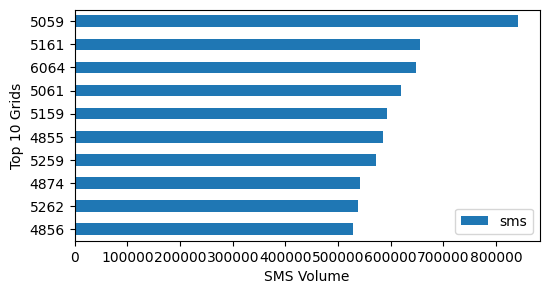

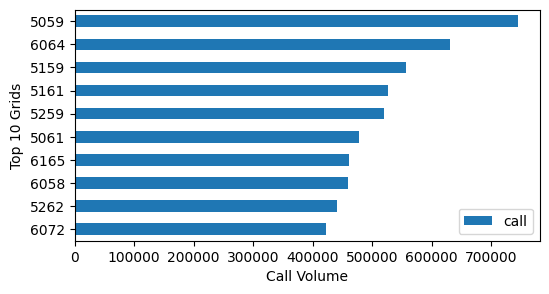

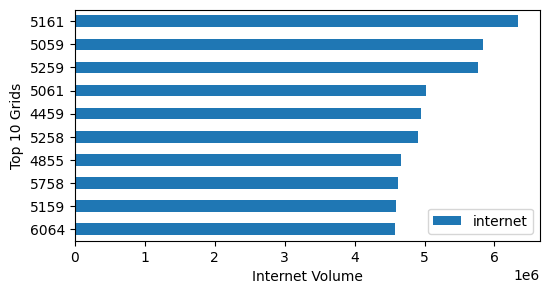

In [ ]:
#Plot top 10 grids and its volume for SMS activity
ax = smsGridActivityMilano[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("SMS Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Call activity
ax = callGridActivityMilano[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("Call Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Internet activity
ax = internetGridActivityMilano[:10].plot(kind='barh', figsize=(6,3))
ax.invert_yaxis()
ax.set_xlabel("Internet Volume")
ax.set_ylabel("Top 10 Grids")
plt.show()

##### Mapping top 10 Grid in Milano

In [ ]:
# Hover to get the grid ID

topgridsMilano = pd.unique(top10_milano.values.ravel())
topGridgeojson = milano.loc[milano['cellId'].isin(topgridsMilano)]

m = folium.Map(location = [45.4642, 9.1900], zoom_start=13)

for _, row in topGridgeojson.iterrows():
    grid_id = row['cellId']
    folium.GeoJson(
        row['geometry'],
        tooltip=str(grid_id),  # Display the grid ID on hover
        popup=f"Grid ID: {grid_id}"  # Display the grid ID on click
    ).add_to(m)

m

#### SMS, Call, Internet Activity Comparison in Top Grids

In [ ]:
#get the daily volumes for the top 10 grids
daily4459 = dailyGridActivityMilano.loc[4459][['sms','call','internet']]
daily4855 = dailyGridActivityMilano.loc[4855][['sms','call','internet']]
daily4856 = dailyGridActivityMilano.loc[4856][['sms','call','internet']]
daily4874 = dailyGridActivityMilano.loc[4874][['sms','call','internet']]
daily5059 = dailyGridActivityMilano.loc[5059][['sms','call','internet']]
daily5061 = dailyGridActivityMilano.loc[5061][['sms','call','internet']]
daily5159 = dailyGridActivityMilano.loc[5159][['sms','call','internet']]
daily5161 = dailyGridActivityMilano.loc[5161][['sms','call','internet']]
daily5258 = dailyGridActivityMilano.loc[5258][['sms','call','internet']]
daily5259 = dailyGridActivityMilano.loc[5259][['sms','call','internet']]
daily5262 = dailyGridActivityMilano.loc[5262][['sms','call','internet']]
daily5758 = dailyGridActivityMilano.loc[5758][['sms','call','internet']]
daily6058 = dailyGridActivityMilano.loc[6058][['sms','call','internet']]
daily6064 = dailyGridActivityMilano.loc[6064][['sms','call','internet']]
daily6072 = dailyGridActivityMilano.loc[6058][['sms','call','internet']]
daily6165 = dailyGridActivityMilano.loc[6058][['sms','call','internet']]

##### Plot daily SMS activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

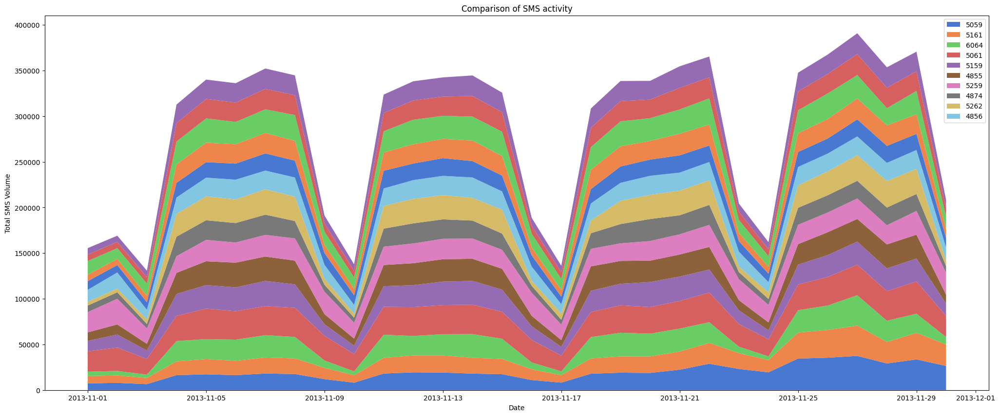

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily4459.index, daily4855.sms, daily4856.sms,daily4874.sms, daily5059.sms,
                   daily5061.sms, daily5159.sms, daily5161.sms, daily5258.sms, daily5259.sms,
                   daily5262.sms, daily5758.sms,daily6058.sms,daily6064.sms,daily6072.sms,daily6165.sms,labels = top10_milano['sms'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total SMS Volume')
plt.title('Comparison of SMS activity')
plt.show()

##### Plot daily Call activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

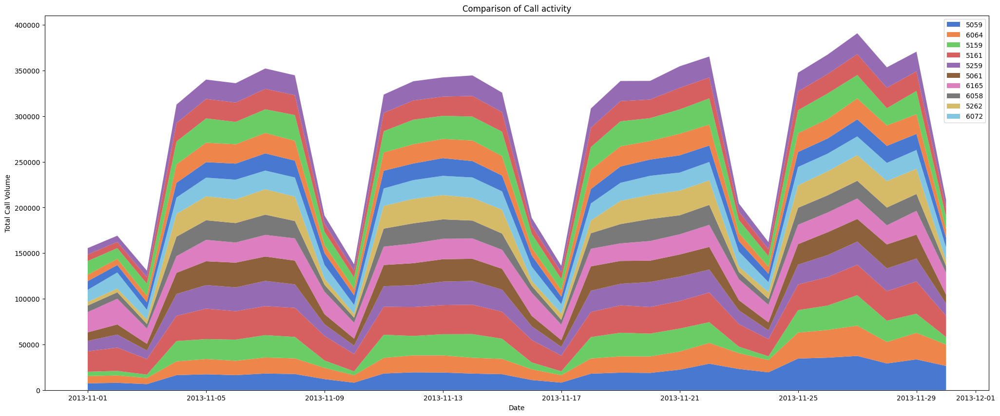

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily4459.index, daily4855.sms, daily4856.sms,daily4874.sms, daily5059.sms,
                   daily5061.sms, daily5159.sms, daily5161.sms, daily5258.sms, daily5259.sms,
                   daily5262.sms, daily5758.sms,daily6058.sms,daily6064.sms,daily6072.sms,daily6165.sms,labels = top10_milano['call'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total Call Volume')
plt.title('Comparison of Call activity')
plt.show()


##### Plot daily Internet activity for top 10 grids from Nov 1, 2013 to Nov 30, 2013

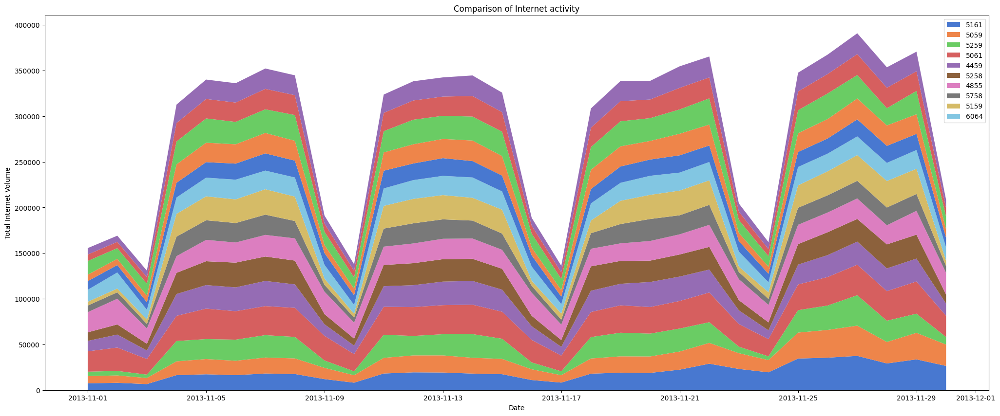

In [ ]:

col = sns.color_palette("muted")
plt.figure(figsize=(25,10))
ax = plt.stackplot(daily4459.index, daily4855.sms, daily4856.sms,daily4874.sms, daily5059.sms,
                   daily5061.sms, daily5159.sms, daily5161.sms, daily5258.sms, daily5259.sms,
                   daily5262.sms, daily5758.sms,daily6058.sms,daily6064.sms,daily6072.sms,daily6165.sms,labels = top10_milano['internet'], colors=col)
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Total Internet Volume')
plt.title('Comparison of Internet activity')
plt.show()


#### Comparison Daily Activity Pattern

##### Grid ID 5059

<Figure size 2500x1000 with 0 Axes>

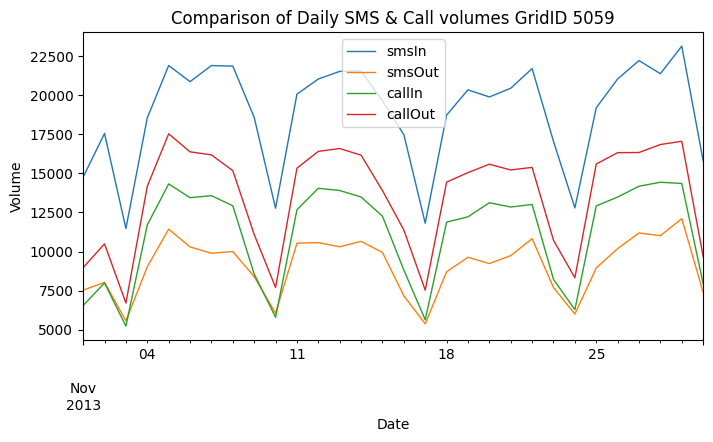

In [ ]:
#Next line is to fix an error that occurs after installing FBProphet module
pd.plotting.register_matplotlib_converters()

#Plot Daily SMS-In, SMS-Out, Call-In, Call-Out activity pattern for GridID 5059
daily5059 = dailyGridActivityMilano.loc[5059]
plt.figure(figsize=(25,10))
ax = daily5059.loc[:,['smsIn', 'smsOut', 'callIn', 'callOut']].plot(figsize=(8, 4), fontsize=10, linewidth=1)
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Comparison of Daily SMS & Call volumes GridID 5059')
# plt.axvspan('2013-11-26', '2013-11-26', color='red')
# plt.axvspan('2013-11-29', '2013-11-29', color='red')
plt.show()

##### Grid 5161

<Figure size 2500x1000 with 0 Axes>

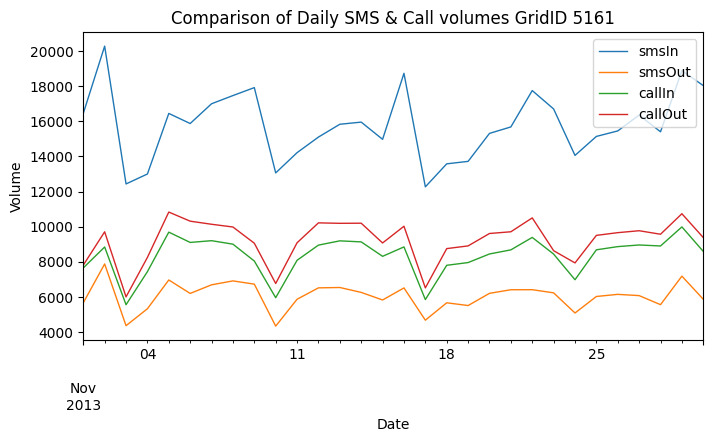

In [ ]:
#Next line is to fix an error that occurs after installing FBProphet module
pd.plotting.register_matplotlib_converters()

#Plot Daily SMS-In, SMS-Out, Call-In, Call-Out activity pattern for GridID 5161
daily5161 = dailyGridActivityMilano.loc[5161]
plt.figure(figsize=(25,10))
ax = daily5161.loc[:,['smsIn', 'smsOut', 'callIn', 'callOut']].plot(figsize=(8, 4), fontsize=10, linewidth=1)
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Comparison of Daily SMS & Call volumes GridID 5161')
# plt.axvspan('2013-11-26', '2013-11-26', color='red')
# plt.axvspan('2013-11-29', '2013-11-29', color='red')
plt.show()

#### Comparison of Hourly Activity Pattern in Grid ID 5059 & 5161

In [ ]:
#Set this to None to avoid Warning messages from Pandas
pd.options.mode.chained_assignment = None

#Get hourly data for the four grids
hourly5059 = hourlyGridActivityMilano.loc[5059]
hourly5161 = hourlyGridActivityMilano.loc[5161]


#Add column to identify Day of the week for each observation
hourly5059['dayOfWeek'] = hourly5059.index.day_name()
hourly5161['dayOfWeek'] = hourly5161.index.day_name()


#Use pivot_table() reshape the dataframe with Mean values of the acitivities for Day of the week as columns and hours in a day as index
hourly5059_sms = hourly5059.pivot_table(index=hourly5059.index.hour,
                                                            columns='dayOfWeek', values='sms', aggfunc='mean')
hourly5059_call = hourly5059.pivot_table(index=hourly5059.index.hour,
                                                            columns='dayOfWeek', values='call', aggfunc='mean')
hourly5059_internet = hourly5059.pivot_table(index=hourly5059.index.hour,
                                                            columns='dayOfWeek', values='internet', aggfunc='mean')
hourly5161_sms = hourly5161.pivot_table(index=hourly5161.index.hour,
                                                            columns='dayOfWeek', values='sms', aggfunc='mean')
hourly5161_call = hourly5161.pivot_table(index=hourly5161.index.hour,
                                                            columns='dayOfWeek', values='call', aggfunc='mean')
hourly5161_internet = hourly5161.pivot_table(index=hourly5161.index.hour,
                                                            columns='dayOfWeek', values='internet', aggfunc='mean')


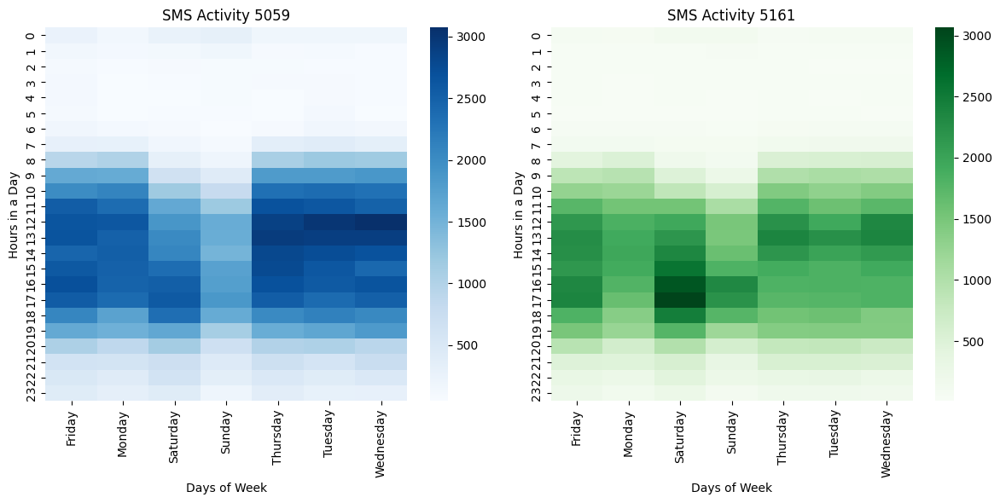

In [ ]:
# From the reshaped dataframe, plot heatmap for SMS activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5059
sns.heatmap(hourly5059_sms, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("SMS Activity 5059")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 5161
sns.heatmap(hourly5161_sms, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("SMS Activity 5161")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()


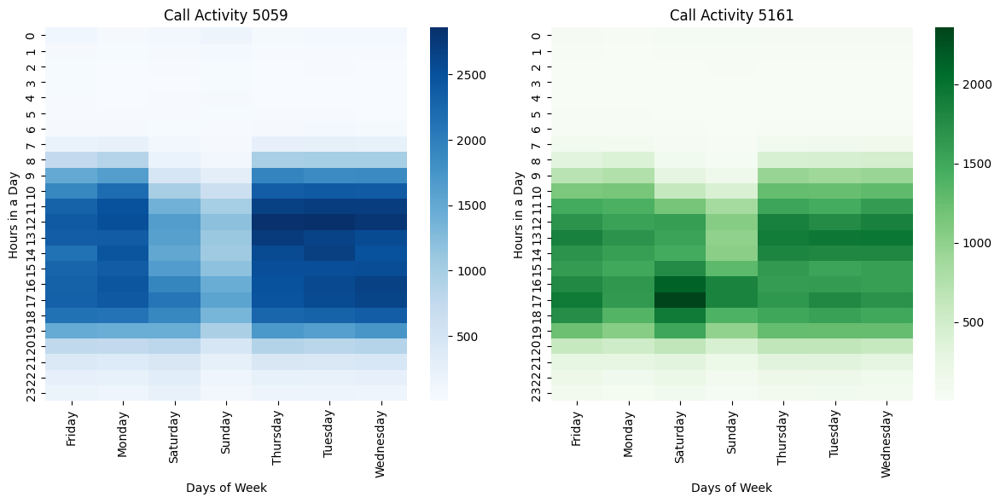

In [ ]:
# From the reshaped dataframe, plot heatmap for call activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5059
sns.heatmap(hourly5059_call, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("Call Activity 5059")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 5161
sns.heatmap(hourly5161_call, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("Call Activity 5161")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()

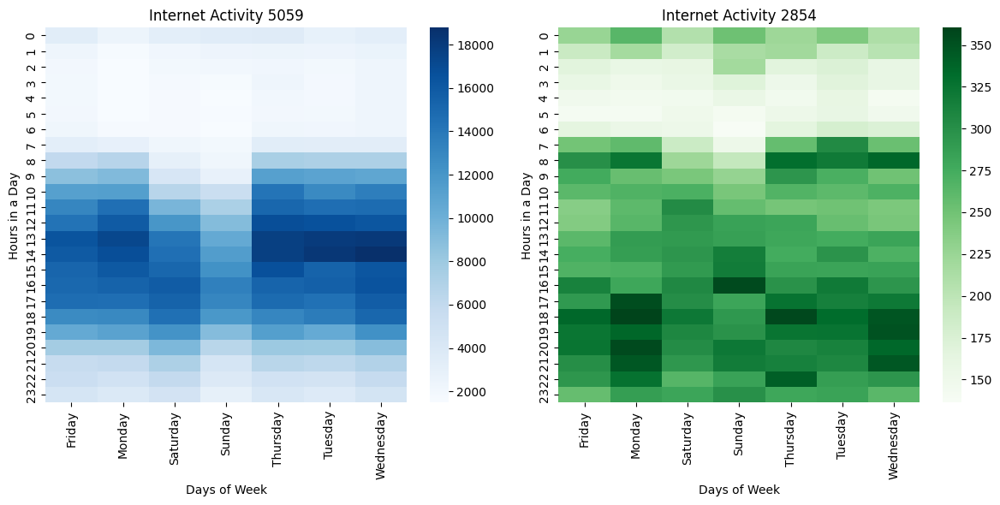

In [ ]:
# From the reshaped dataframe, plot heatmap for internet activity of the two grids
fig, ax = plt.subplots(figsize=(12, 6), ncols=2)  # Use ncols=2 for two plots side by side

# First heatmap for grid 5059
sns.heatmap(hourly5059_internet, ax=ax[0], cmap="Blues", cbar=True)
ax[0].set_title("Internet Activity 5059")
ax[0].set_ylabel("Hours in a Day")
ax[0].set_xlabel("Days of Week")

# Second heatmap for grid 5161
sns.heatmap(hourly2854_internet, ax=ax[1], cmap="Greens", cbar=True)
ax[1].set_title("Internet Activity 2854")
ax[1].set_ylabel("Hours in a Day")
ax[1].set_xlabel("Days of Week")

# Adjust layout
plt.tight_layout()
plt.show()


### Correlation between Call, SMS, and Internet Usage (using daily data)

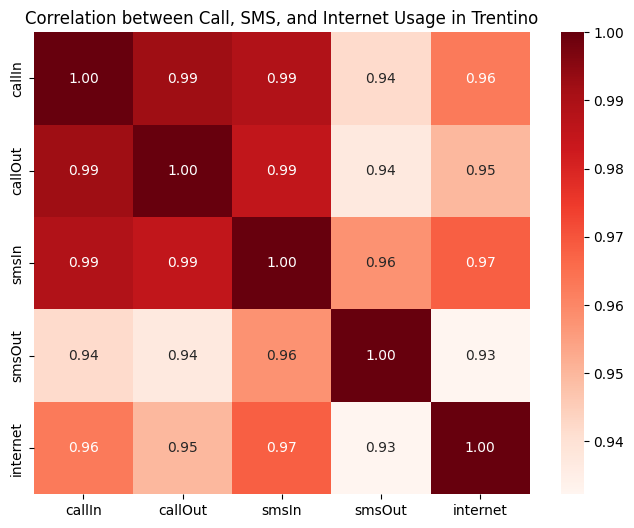

In [ ]:

usage_data = dailyGridActivityMilano.groupby(level=0)[['callIn', 'callOut', 'smsIn', 'smsOut', 'internet']].sum()
correlation_matrix = usage_data.corr()

# Plot correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt='.2f', cbar=True)
plt.title('Correlation between Call, SMS, and Internet Usage in Trentino')
plt.show()

### Insight


**Business Insight Analysis for Telecommunication in Milano, Italy**

**Overview of Milano**
Milano (Milan) is Italy’s second-largest metropolitan area and a renowned hub for finance, fashion, education, and culture. Home to prestigious institutions like Politecnico di Milano and Università degli Studi di Milano, the city is a leading center for education in Europe. With its advanced infrastructure and large business community, Milano is one of the most digitally connected cities in the country.

---

**Key Insights**
1. **High Activity Grids:**
   - Milano has **16 high-activity grids**, reflecting significant telecommunication intensity across SMS, calls, and internet usage.
   - These grids encompass key business, educational, and commercial areas, such as the **Porta Nuova district** and **Città Studi**.

2. **Usage Patterns:**
   - **Workdays (Monday to Saturday):** High telecommunication activity is observed for six days, with a marked decrease only on Sundays.
   - **Hourly Trends:**
     - **SMS:** Peaks between 08:00–19:00, particularly during morning hours before the workday begins.
     - **Calls:** High activity between 08:00–12:00 and another peak from 15:00–18:00.
     - **Internet:** Steady high usage from 08:00–20:00, with the highest peaks on Wednesdays and Fridays.

---

**Business Insights**
1. **Economic and Technological Significance:**
   - As a hub for business and education, Milano presents substantial opportunities for digital infrastructure development, including **5G networks** and internet-based services.
   - The high activity across 16 grids highlights potential for **smart city initiatives**, such as data-driven public service management and optimized urban connectivity.

2. **Marketing and Customer Engagement:**
   - **SMS Campaigns:** Leverage the peak SMS usage during working hours to promote products and services, particularly in business districts.
   - **Internet Advertising:** Capitalize on peak internet usage times for targeted campaigns aimed at students and professionals.

3. **Operational Enhancements:**
   - **Scalable Networks:** The high activity in these 16 grids requires investments in scalable network capacity.
   - **Service Reliability:** Ensure network stability during work hours to support Milano’s business and educational communities.

4. **Educational and Cultural Opportunities:**
   - Milano is ideal for promoting digital education services, such as e-learning and tailored connectivity for universities.
   - The consistent six-day activity pattern indicates a demand for reliable services beyond Sunday.

---

**Strategic Recommendations**
1. **Targeted Infrastructure Development:**
   - Focus on upgrading networks in the 16 high-activity grids to ensure higher speed and reliability.
   - Expand public Wi-Fi access in educational and cultural hotspots.

2. **Enhance Digital Marketing Strategies:**
   - Use peak SMS and internet activity periods to launch campaigns targeting students, professionals, and tourists.

3. **Collaborate for Smart City Initiatives:**
   - Partner with local authorities to integrate telecommunication data into urban planning projects, such as traffic management and public transportation enhancements.

4. **Offer Tailored Services:**
   - Introduce hybrid service packages combining SMS and internet to meet the needs of Milano’s professionals and students.

5. **Predictive Analytics for Network Planning:**
   - Utilize activity patterns to anticipate demand and guide future network upgrades and customer service enhancements.

---

**Comparison with Trentino**
- Similar to Trentino, Milano exhibits high telecommunication activity on weekdays, with a drop on Sundays.
- The key difference lies in the scale, with Milano having **16 high-activity grids** compared to 11 in Trentino, and a broader geographical reach due to its metropolitan nature.

---

**Conclusion**
Milano presents significant opportunities for telecommunication service providers to support its business, education, and digital lifestyle needs. By aligning investments with these insights, companies can strengthen their presence in Milano while contributing to its transformation into a smarter, more connected, and sustainable city.

# Summary

**Summary of Business Insights for Telecommunications and IT in Milano and Trentino**

Milano and Trentino offer unique opportunities for growth in the telecommunications and IT sectors, shaped by their distinct roles and needs. Milano, as Italy’s financial and corporate hub, demands robust and scalable infrastructure to support high-volume internet usage, professional communication, and enterprise-grade IT solutions. In contrast, Trentino, a center for innovation, education, and sustainability, emphasizes localized investments in high-speed internet and secure networks to cater to academic, business, and tourism-driven activities.

Both regions exhibit high telecommunication activity during workdays, with Milano leaning toward corporate internet and call usage, while Trentino highlights SMS as a preferred communication method. These patterns present opportunities for tailored offerings such as SMS-based marketing in Trentino and advanced IT solutions in Milano. Furthermore, both regions are well-suited for smart city initiatives and IoT integration to enhance urban development and connectivity.

Strategic investments in infrastructure, customer-focused solutions, and collaboration with local governments can unlock significant growth while ensuring reliability and scalability in these high-potential markets.